## Group Members : Tharun Prabhakar, Niranjan Kumar, Sumit Kumar

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
from pyod.models.pca import PCA
from pyod.models.knn import KNN
from warnings import filterwarnings
from sklearn.model_selection import train_test_split 

filterwarnings('ignore')
plt.rcParams['figure.figsize']=[18,12]

In [2]:
df=pd.read_csv('inpatientCharges.csv')
df.head()

,DRG Definition,Provider Id,Provider Name,Provider Street Address,Provider City,Provider State,Provider Zip Code,Hospital Referral Region Description,Total Discharges,Average Covered Charges,Average Total Payments,Average Medicare Payments
0,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,AL - Dothan,91,$32963.07,$5777.24,$4763.73
1,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10005,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,AL - Birmingham,14,$15131.85,$5787.57,$4976.71
2,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10006,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631,AL - Birmingham,24,$37560.37,$5434.95,$4453.79
3,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10011,ST VINCENT'S EAST,50 MEDICAL PARK EAST DRIVE,BIRMINGHAM,AL,35235,AL - Birmingham,25,$13998.28,$5417.56,$4129.16
4,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10016,SHELBY BAPTIST MEDICAL CENTER,1000 FIRST STREET NORTH,ALABASTER,AL,35007,AL - Birmingham,18,$31633.27,$5658.33,$4851.44


In [3]:
df.shape

(163065, 12)

In [4]:
df.columns

Index(['DRG Definition', 'Provider Id', 'Provider Name',
       'Provider Street Address', 'Provider City', 'Provider State',
       'Provider Zip Code', 'Hospital Referral Region Description',
       ' Total Discharges ', ' Average Covered Charges ',
       ' Average Total Payments ', 'Average Medicare Payments'],
      dtype='object')

In [5]:
df.dtypes

DRG Definition                          object
Provider Id                              int64
Provider Name                           object
Provider Street Address                 object
Provider City                           object
Provider State                          object
Provider Zip Code                        int64
Hospital Referral Region Description    object
 Total Discharges                        int64
 Average Covered Charges                object
 Average Total Payments                 object
Average Medicare Payments               object
dtype: object

In [6]:
df.rename(columns={' Average Covered Charges ':'Average Covered Charges',
                    ' Total Discharges ':'Total Discharges',
                    ' Average Total Payments ':'Average Total Payments'},inplace=True)

In [7]:
df.columns

Index(['DRG Definition', 'Provider Id', 'Provider Name',
       'Provider Street Address', 'Provider City', 'Provider State',
       'Provider Zip Code', 'Hospital Referral Region Description',
       'Total Discharges', 'Average Covered Charges', 'Average Total Payments',
       'Average Medicare Payments'],
      dtype='object')

In [8]:
x=list(df.columns)[-3:]
for i in x:
    df[i]=df[i].apply(lambda x: float(x.split('$')[1]))

In [9]:
df['Total Payment']=df['Average Total Payments']* df['Total Discharges']
df['Medicare Payment amount']=df['Average Medicare Payments'] * df['Total Discharges']
df['Total Covered Charge Amount']=df['Average Covered Charges'] * df['Total Discharges']

In [10]:
df.head()

,DRG Definition,Provider Id,Provider Name,Provider Street Address,Provider City,Provider State,Provider Zip Code,Hospital Referral Region Description,Total Discharges,Average Covered Charges,Average Total Payments,Average Medicare Payments,Total Payment,Medicare Payment amount,Total Covered Charge Amount
0,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,AL - Dothan,91,32963.07,5777.24,4763.73,525728.84,433499.43,2999639.37
1,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10005,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,AL - Birmingham,14,15131.85,5787.57,4976.71,81025.98,69673.94,211845.90
2,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10006,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631,AL - Birmingham,24,37560.37,5434.95,4453.79,130438.80,106890.96,901448.88
3,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10011,ST VINCENT'S EAST,50 MEDICAL PARK EAST DRIVE,BIRMINGHAM,AL,35235,AL - Birmingham,25,13998.28,5417.56,4129.16,135439.00,103229.00,349957.00
4,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10016,SHELBY BAPTIST MEDICAL CENTER,1000 FIRST STREET NORTH,ALABASTER,AL,35007,AL - Birmingham,18,31633.27,5658.33,4851.44,101849.94,87325.92,569398.86


In [11]:
df.dtypes

DRG Definition                           object
Provider Id                               int64
Provider Name                            object
Provider Street Address                  object
Provider City                            object
Provider State                           object
Provider Zip Code                         int64
Hospital Referral Region Description     object
Total Discharges                          int64
Average Covered Charges                 float64
Average Total Payments                  float64
Average Medicare Payments               float64
Total Payment                           float64
Medicare Payment amount                 float64
Total Covered Charge Amount             float64
dtype: object

In [12]:
df.describe()

,Provider Id,Provider Zip Code,Total Discharges,Average Covered Charges,Average Total Payments,Average Medicare Payments,Total Payment,Medicare Payment amount,Total Covered Charge Amount
count,163065.000000,163065.000000,163065.000000,163065.000000,163065.000000,163065.000000,1.630650e+05,1.630650e+05,1.630650e+05
mean,255569.865428,47938.121908,42.776304,36133.954224,9707.473804,8494.490964,4.089749e+05,3.554069e+05,1.508465e+06
std,151563.671767,27854.323080,51.104042,35065.365931,7664.642598,7309.467261,6.592961e+05,5.766743e+05,2.531100e+06
min,10001.000000,1040.000000,11.000000,2459.400000,2673.000000,1148.900000,3.031193e+04,1.263790e+04,2.971892e+04
25%,110092.000000,27261.000000,17.000000,15947.160000,5234.500000,4192.350000,1.215319e+05,1.001459e+05,3.841509e+05
50%,250007.000000,44309.000000,27.000000,25245.820000,7214.100000,6158.460000,2.255856e+05,1.915830e+05,7.828449e+05
75%,380075.000000,72901.000000,49.000000,43232.590000,11286.400000,10056.880000,4.513765e+05,3.930409e+05,1.663046e+06
max,670077.000000,99835.000000,3383.000000,929118.900000,156158.180000,154620.810000,6.435718e+07,5.034036e+07,1.796832e+08


In [13]:
df.describe(include='object')

,DRG Definition,Provider Name,Provider Street Address,Provider City,Provider State,Hospital Referral Region Description
count,163065,163065,163065,163065,163065,163065
unique,100,3201,3326,1977,51,306
top,194 - SIMPLE PNEUMONIA & PLEURISY W CC,GOOD SAMARITAN HOSPITAL,100 MEDICAL CENTER DRIVE,CHICAGO,CA,CA - Los Angeles
freq,3023,633,183,1505,13064,3653


In [14]:
duplicate_rows_df = df[df.duplicated()]
print("number of duplicate rows: ", duplicate_rows_df.shape)

number of duplicate rows:  (0, 15)


In [15]:
# Null Value
total=df.isnull().sum().sort_values(ascending=False)
percent=(df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missed=pd.concat([total,percent],axis=1,keys=['total','percent'])
missed

,total,percent
DRG Definition,0,0.0
Provider Id,0,0.0
Provider Name,0,0.0
Provider Street Address,0,0.0
Provider City,0,0.0
Provider State,0,0.0
Provider Zip Code,0,0.0
Hospital Referral Region Description,0,0.0
Total Discharges,0,0.0
Average Covered Charges,0,0.0


In [16]:
#seggregating numerical and categorical columns
num=list(df.select_dtypes(include='number').columns)
cat=list(df.select_dtypes(include='object').columns)

In [17]:
num

['Provider Id',
 'Provider Zip Code',
 'Total Discharges',
 'Average Covered Charges',
 'Average Total Payments',
 'Average Medicare Payments',
 'Total Payment',
 'Medicare Payment amount',
 'Total Covered Charge Amount']

In [18]:
cat

['DRG Definition',
 'Provider Name',
 'Provider Street Address',
 'Provider City',
 'Provider State',
 'Hospital Referral Region Description']

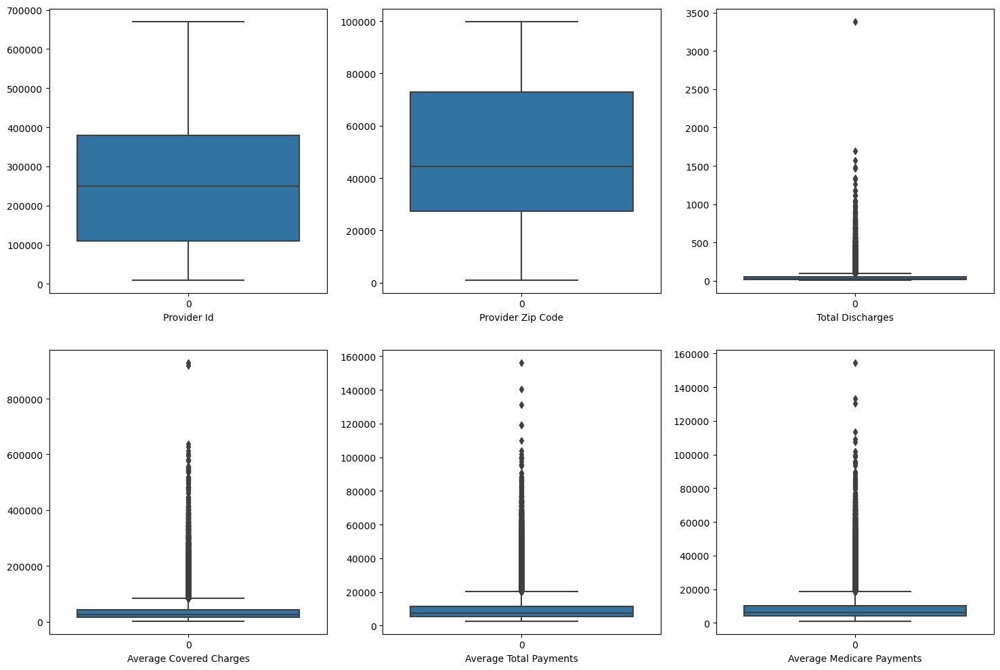

In [19]:
fig,ax=plt.subplots(nrows=2,ncols=3,figsize=[18,12])
for i,j in zip(num,ax.flatten()):
    sb.boxplot(df[i],ax=j).set(xlabel=i)
plt.show()

In [20]:
# # Create a figure with 2x2 subplots
# fig = make_subplots(rows=2, cols=3)

# # Add a box plot to each subplot
# fig.add_trace(go.Box(x=df[num[0]], name=num[0]),row=1,col=1)
# fig.add_trace(go.Box(x=df[num[1]], name=num[1]),row=1,col=2)
# fig.add_trace(go.Box(x=df[num[2]], name=num[2]),row=1,col=3)
# fig.add_trace(go.Box(x=df[num[3]], name=num[3]),row=2,col=1)
# fig.add_trace(go.Box(x=df[num[4]], name=num[4]),row=2,col=2)
# fig.add_trace(go.Box(x=df[num[5]], name=num[5]),row=2,col=3)

# fig.update_layout(margin=dict(l=20, r=20, t=20, b=20),paper_bgcolor="LightSteelBlue",width=1000,height=600)
# # Show the plot
# fig.show()

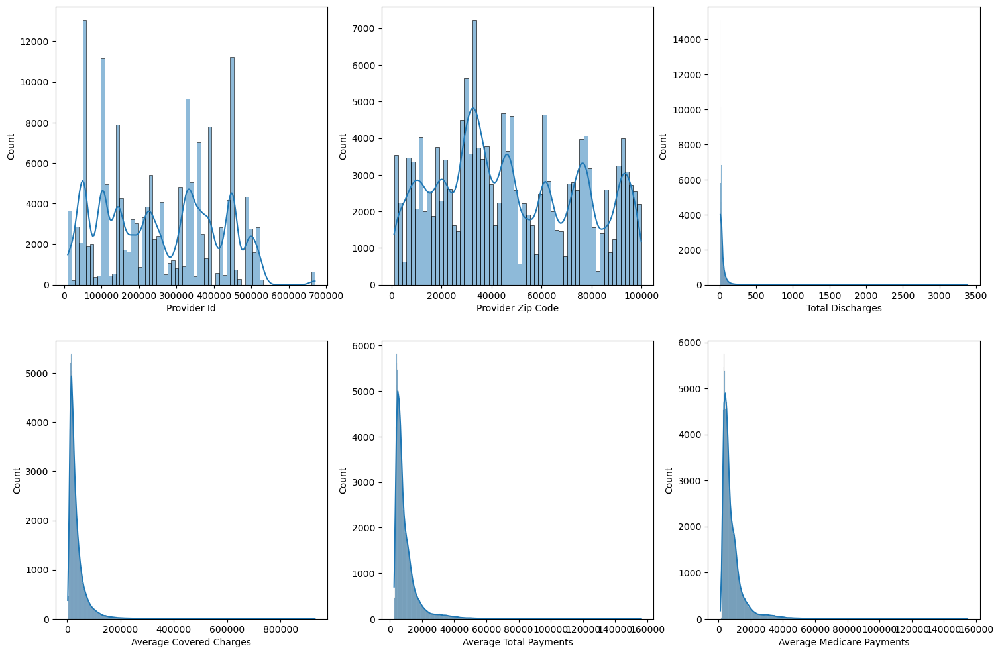

In [21]:
fig,ax=plt.subplots(nrows=2,ncols=3,figsize=[18,12])
for i,j in zip(num,ax.flatten()):
    sb.histplot(df[i],ax=j,kde=True)
plt.show()

In [22]:
# fig = make_subplots(rows=2, cols=3)

# # Add a box plot to each subplot
# fig.add_trace(go.Histogram(x=df[num[0]], name=num[0]),row=1,col=1)
# fig.add_trace(go.Histogram(x=df[num[1]], name=num[1]),row=1,col=2)
# fig.add_trace(go.Histogram(x=df[num[2]], name=num[2]),row=1,col=3)
# fig.add_trace(go.Histogram(x=df[num[3]], name=num[3]),row=2,col=1)
# fig.add_trace(go.Histogram(x=df[num[4]], name=num[4]),row=2,col=2)
# fig.add_trace(go.Histogram(x=df[num[5]], name=num[5]),row=2,col=3)

# fig.update_layout(margin=dict(l=20, r=20, t=20, b=20),paper_bgcolor="LightSteelBlue",width=1000,height=600)
# # Show the plot
# fig.show()

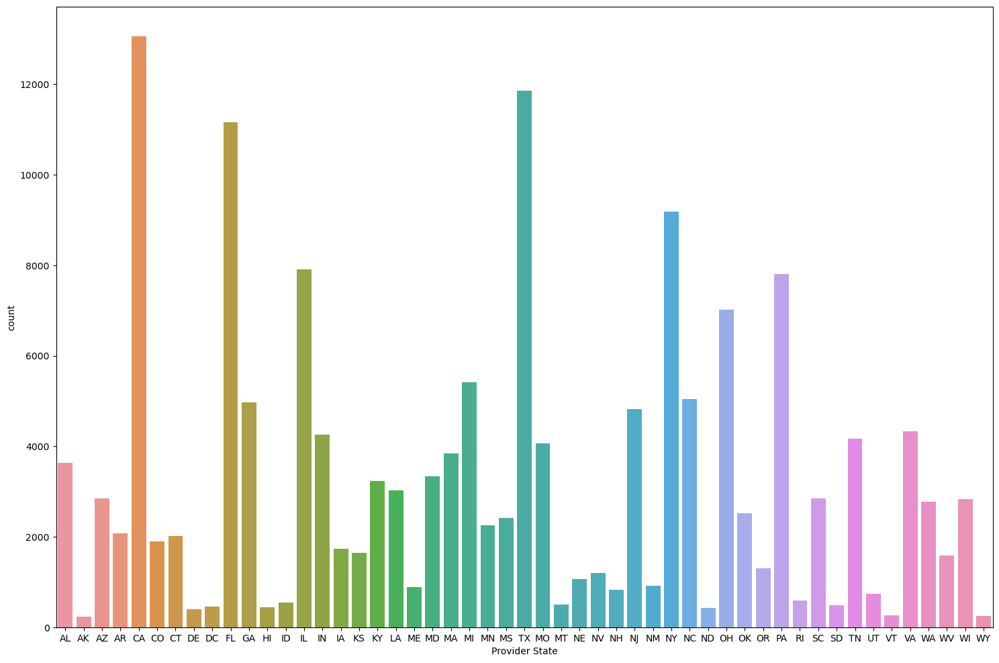

In [23]:
sb.countplot(data=df,x='Provider State')
plt.show()

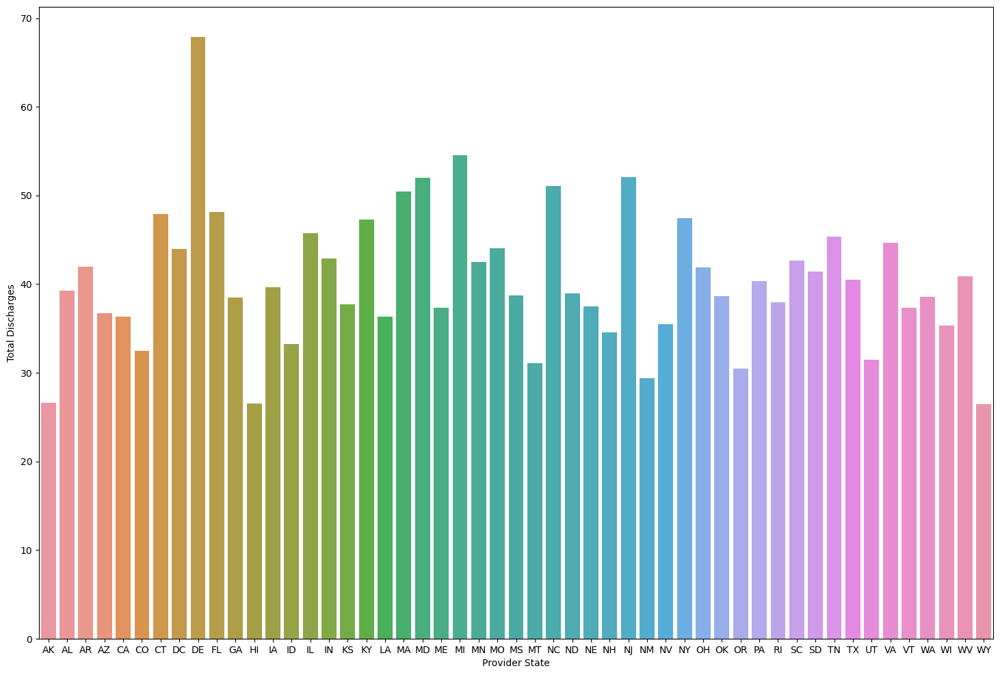

In [24]:
df0=pd.pivot_table(data=df,index='Provider State',values='Total Discharges',aggfunc='mean').reset_index()
sb.barplot(data=df0,x='Provider State',y='Total Discharges')
plt.show()

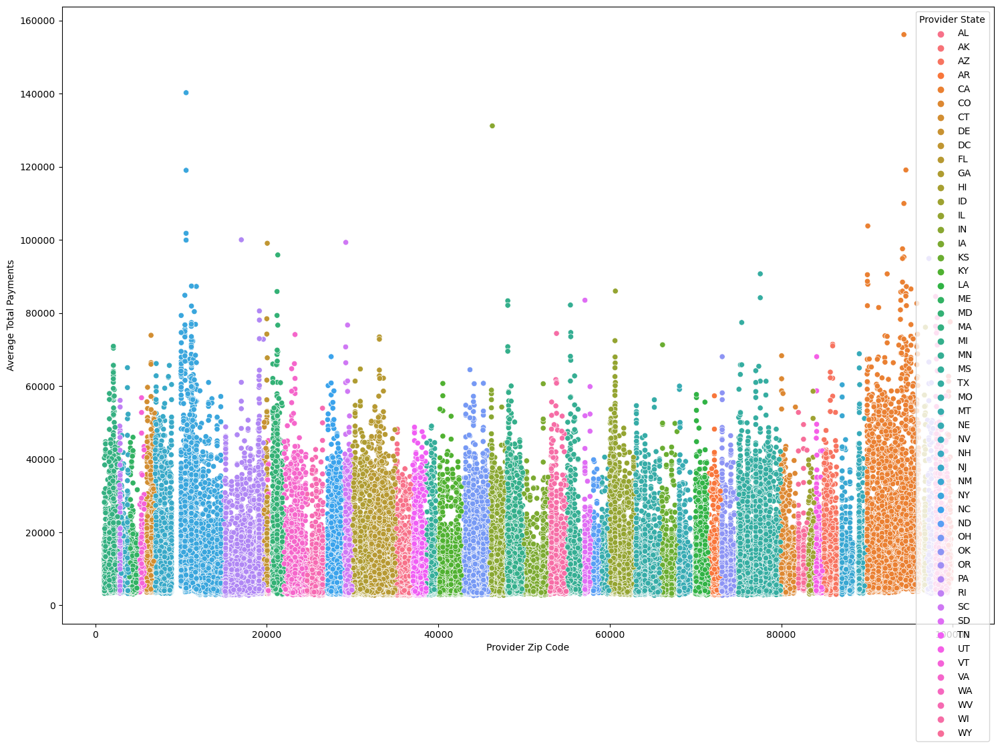

In [25]:
sb.scatterplot(data=df,x='Provider Zip Code',y='Average Total Payments',hue='Provider State')
plt.show()

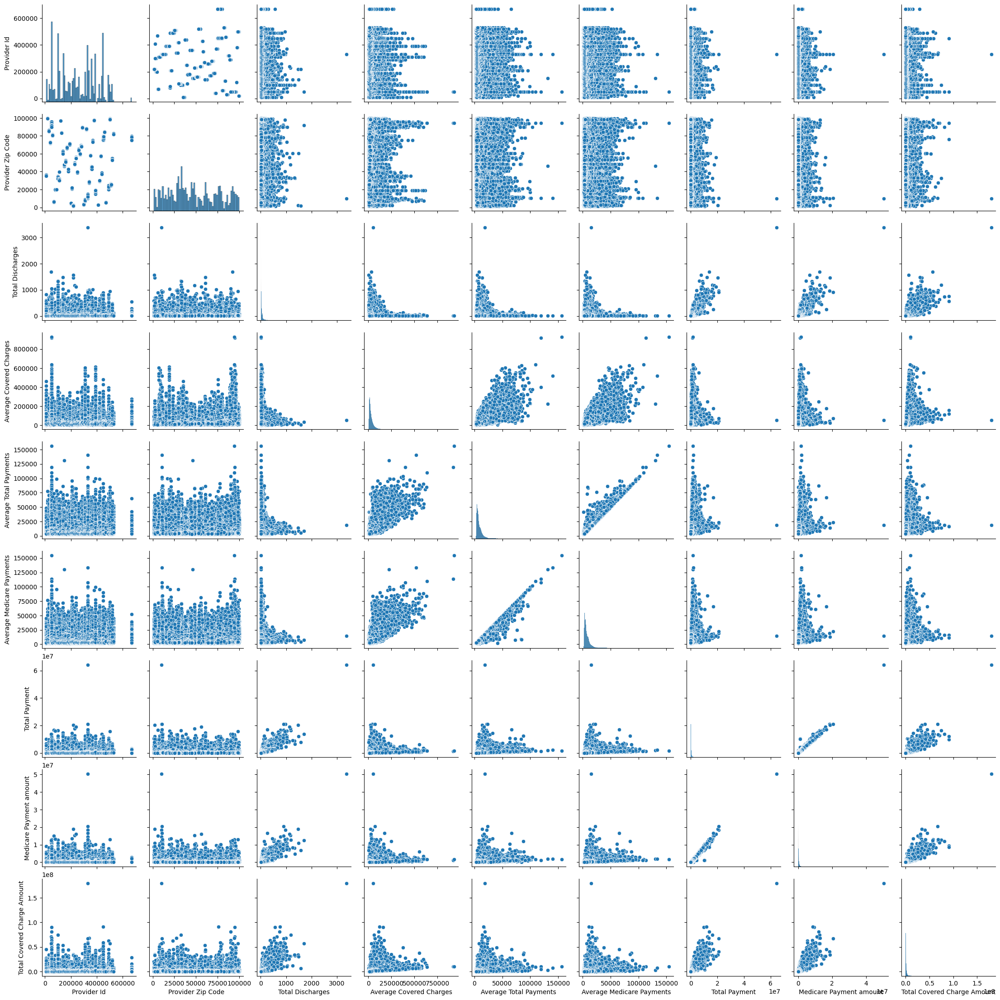

In [26]:
sb.pairplot(data=df)

Created a feature for Provider Region like dividing US states into four regions (Northeast, West, Midwest, South).This will useful for checking which region has more fraud.

In [26]:
state_to_region = {
    'CT': 'Northeast', 'ME': 'Northeast', 'MA': 'Northeast', 'NH': 'Northeast', 'RI': 'Northeast', 'VT': 'Northeast',
    'NJ': 'Northeast', 'NY': 'Northeast', 'PA': 'Northeast',
    
    'AK': 'West', 'CA': 'West', 'HI': 'West', 'NV': 'West', 'OR': 'West', 'WA': 'West','ID': 'West', 'MT': 'West', 'WY': 'West',
    'UT': 'West', 'CO': 'West', 'NM': 'West','AZ': 'West',
    
    'IL': 'Midwest', 'IN': 'Midwest', 'MI': 'Midwest', 'OH': 'Midwest', 'WI': 'Midwest','ND': 'Midwest', 'MN': 'Midwest', 'SD': 'Midwest',
    'NE': 'Midwest', 'IA': 'Midwest','KS': 'Midwest', 'MO': 'Midwest',
    
    'AL': 'South', 'AR': 'South','DC': 'South', 'DE': 'South', 'FL': 'South', 'GA': 'South', 'KY': 'South', 'LA': 'South',
    'MD': 'South', 'MS': 'South', 'NC': 'South', 'OK': 'South', 'SC': 'South', 'TN': 'South', 'TX': 'South', 'VA': 'South', 'WV': 'South'
}

df['Provider Region'] = df['Provider State'].map(state_to_region)
df.head()

,DRG Definition,Provider Id,Provider Name,Provider Street Address,Provider City,Provider State,Provider Zip Code,Hospital Referral Region Description,Total Discharges,Average Covered Charges,Average Total Payments,Average Medicare Payments,Total Payment,Medicare Payment amount,Total Covered Charge Amount,Provider Region
0,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,AL - Dothan,91,32963.07,5777.24,4763.73,525728.84,433499.43,2999639.37,South
1,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10005,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,AL - Birmingham,14,15131.85,5787.57,4976.71,81025.98,69673.94,211845.90,South
2,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10006,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631,AL - Birmingham,24,37560.37,5434.95,4453.79,130438.80,106890.96,901448.88,South
3,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10011,ST VINCENT'S EAST,50 MEDICAL PARK EAST DRIVE,BIRMINGHAM,AL,35235,AL - Birmingham,25,13998.28,5417.56,4129.16,135439.00,103229.00,349957.00,South
4,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10016,SHELBY BAPTIST MEDICAL CENTER,1000 FIRST STREET NORTH,ALABASTER,AL,35007,AL - Birmingham,18,31633.27,5658.33,4851.44,101849.94,87325.92,569398.86,South


<Axes: xlabel='Provider Region'>

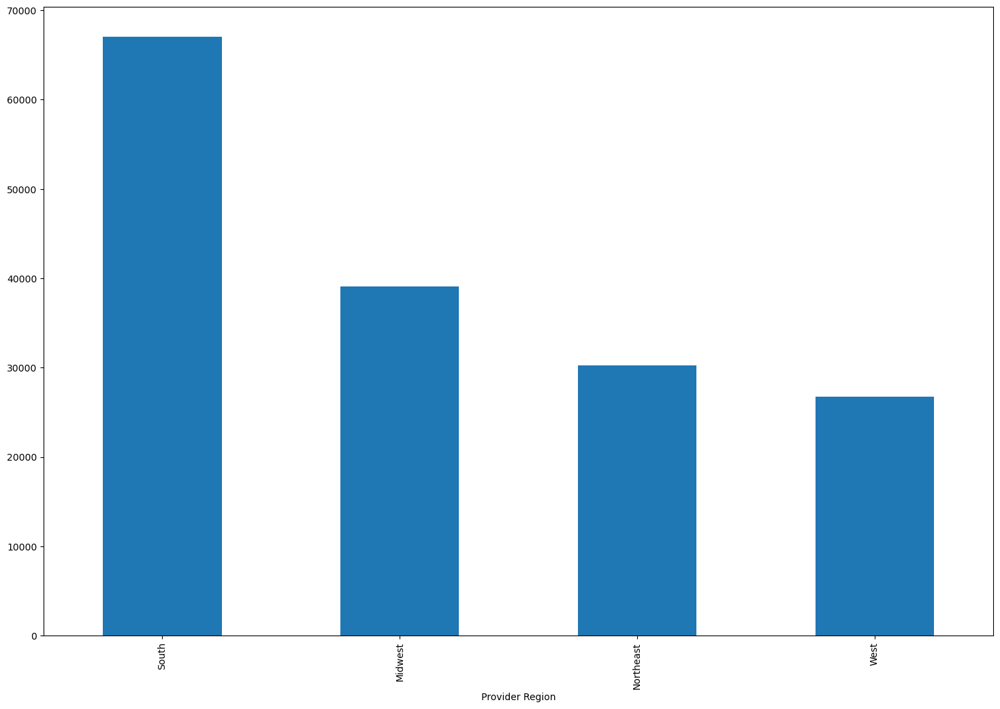

In [27]:
df['Provider Region'].value_counts().plot.bar()

From above charts we can see the data divided among the regions of USA and south is the region with most providers, while west has the least number of providers.

In [28]:
df.shape

(163065, 16)

* Above we see the shape of the dataframe and see that df has 163K clean rows to be analysed, and the categorical variables in the df shows how many different variation of data exist in df.
* This diversity underscores the complexity of the dataset and necessitates a careful examination of these categorical variables for a comprehensive analysis.
* Hence below we are going to calculate z score for 20 combination of Categorical and Continous variable, these 20 combination will give us the 20 feature that we are seeking from the data.

**Summary**: These feature represents the standardized score of the total number of discharges, Average Covered Charges, Average Total Payments, Average Medicare Payments by a provider region, DRG Definition, Hospital Referral Region, Provider City, Provider Name respectively.

**Insight**: 
1. An unusually high or low number of discharges, could indicate irregularities in patient admissions or discharge practices. This could be a sign of fraudulent activities like patient churning or unnecessary admissions.

2. Extreme values in this features may indicate that a supplier charges much more or less than competitors in the same location. This might suggest service overcharging, service undercharging as part of a bribe fraudulent activity, or service fraud.

3. Total payments that are unusually high or low may indicate billing problems. High levels may indicate overutilization of services, while low values may indicate a lack or unreported services.

4. Significant differences in Medicare payments can be indicators of fraudulent activity, such as false claims or services not provided. Both abnormally high and unusually low results require additional investigation.

In [29]:
#Z-value for the Provider Region
List=df[['Total Discharges','Average Covered Charges','Average Total Payments','Average Medicare Payments']].groupby(df['Provider Region'])
list1=List.transform('mean')
list2=List.transform('std')
data=(df[['Total Discharges','Average Covered Charges','Average Total Payments','Average Medicare Payments']] - list1)/list2
data.columns = [f"{col}_z-value_PR" for col in data.columns]
data.head()

,Total Discharges_z-value_PR,Average Covered Charges_z-value_PR,Average Total Payments_z-value_PR,Average Medicare Payments_z-value_PR
0,0.908503,-0.013146,-0.461808,-0.459220
1,-0.573785,-0.601873,-0.460301,-0.426420
2,-0.381280,0.138641,-0.511775,-0.506951
3,-0.362030,-0.639300,-0.514314,-0.556945
4,-0.496783,-0.057052,-0.479167,-0.445712


**Discharges Total_z-value_PR**: A high positive z-value shows that a provider has more discharges than the region's standard, which might imply significant patient turnover or over-admissions in comparison to competitors. A negative z-value indicates fewer discharges than predicted, which might be related to lower admission rates or stricter admission requirements.

**Covered Charges Average_z-value_PR**: Positive z-values show that a provider's charges are greater than the regional average,  which could indicate overcharging or higher service costs. Negative numbers may indicate undercharging as a result of reduced operating expenses or alternative pricing methods.

**Average Total Payments_z-value_PR**: This measure compares the provider's total payments to the regional average. A greater z-value may indicate possible overutilization or overbilling of services, whilst a lower value may imply underbilling or more efficient service supply.

**Medicare Average Payments_z-value_PR**: Positive z-values indicate that the provider receives more from Medicare than the area average, which might be attributable to increased service utilisation or invoicing for more sophisticated treatments. Negative z-values may imply decreased reliance on Medicare, either as a result of a patient mix with less Medicare coverage or more cautious billing procedures.

In [30]:
list=df[['Total Discharges','Average Covered Charges','Average Total Payments','Average Medicare Payments']].groupby(df['DRG Definition'])
list1=list.transform('mean')
list2=list.transform('std')
data1=(df[['Total Discharges','Average Covered Charges','Average Total Payments','Average Medicare Payments']] - list1)/list2
data1.columns = [f"{col}_z-value_DRG" for col in data1.columns]
data1.head()

,Total Discharges_z-value_DRG,Average Covered Charges_z-value_DRG,Average Total Payments_z-value_DRG,Average Medicare Payments_z-value_DRG
0,2.731021,0.155639,-0.800673,-0.640831
1,-0.782309,-0.962919,-0.793683,-0.468526
2,-0.326033,0.444029,-1.032283,-0.891578
3,-0.280405,-1.034028,-1.044050,-1.154211
4,-0.599799,0.072220,-0.881133,-0.569872


**Total Discharges_z-value_DRG**: A high z-value, like the 2.73 for the first entry, suggests significantly higher patient discharges compared to others in the same DRG category, which might indicate high treatment frequency or potential overuse of services. Negative values, like -0.78, indicate lower than average discharges, which could mean more selective patient treatment or potentially insufficient care.

**Average Covered Charges_z-value_DRG**: Positive z-scores imply that a provider's charges are higher than the average for that DRG category, which could suggest overpricing or specialization in more complex procedures. Negative scores suggest lower-than-average charges, which could reflect more efficient care, lower cost structures, or potentially undercharging.

**Average Total Payments_z-value_DRG**: This metric reflects whether the provider's total payments are high or low relative to the DRG average. For example, a z-score of -1.03 indicates payments are lower than average, which may raise questions about the provider's service quality or billing practices.

**Average Medicare Payments_z-value_DRG**: These z-scores indicate how a provider's Medicare payments compare to the average for the DRG. Negative values, such as -1.15, could suggest a provider is receiving less Medicare reimbursement than peers, possibly due to lower service utilization or conservative billing.

In [31]:
list=df[['Total Discharges','Average Covered Charges','Average Total Payments','Average Medicare Payments']].groupby(df['Hospital Referral Region Description'])
list1=list.transform('mean')
list2=list.transform('std')
data2=(df[['Total Discharges','Average Covered Charges','Average Total Payments','Average Medicare Payments']] - list1)/list2
data2.columns = [f"{col}_z-value_Reff" for col in data2.columns]
data2.head()

,Total Discharges_z-value_Reff,Average Covered Charges_z-value_Reff,Average Total Payments_z-value_Reff,Average Medicare Payments_z-value_Reff
0,1.359967,0.228345,-0.273428,-0.276261
1,-0.637461,-0.551520,-0.357915,-0.307998
2,-0.351035,0.044807,-0.423086,-0.408636
3,-0.322393,-0.581659,-0.426301,-0.471111
4,-0.522891,-0.112782,-0.381801,-0.332107


**Total Discharges_z-value_Reff**: A high z-score, like the 1.36 for the first entry, indicates that a hospital has a higher number of discharges compared to the average in its referral region. This could suggest a higher patient volume or a tendency to admit and discharge more frequently than other hospitals in the area.

**Average Covered Charges_z-value_Reff**: This measures how a hospital's average charges for services compare to the regional average. A positive z-score indicates higher than average charges, which might reflect a hospital's pricing strategy or suggest that it provides more specialized or intensive services.

**Average Total Payments_z-value_Reff**: A negative z-score here suggests that a hospital is receiving lower total payments than the regional average, possibly indicating efficiency in service delivery or challenges in obtaining reimbursements.

**Average Medicare Payments_z-value_Reff**: Negative z-scores suggest that a hospital's Medicare payments are less than the regional average. This could raise questions about the hospital's Medicare patient demographics, the mix of services provided to Medicare patients, or its Medicare billing practices.

In [32]:
list=df[['Total Discharges','Average Covered Charges','Average Total Payments','Average Medicare Payments']].groupby(df['Provider City'])
list1=list.transform('mean')
list2=list.transform(np.std)
data3=(df[['Total Discharges','Average Covered Charges','Average Total Payments','Average Medicare Payments']] - list1)/list2
data3.columns = [f"{col}_z-value_ProvCity" for col in data3.columns]
data3.head()

,Total Discharges_z-value_ProvCity,Average Covered Charges_z-value_ProvCity,Average Total Payments_z-value_ProvCity,Average Medicare Payments_z-value_ProvCity
0,0.832397,-0.253140,-0.456736,-0.444381
1,-0.819453,-0.147131,-0.376991,-0.293387
2,-0.576670,-0.141190,-0.534900,-0.524413
3,-0.443947,-0.749566,-0.537415,-0.540631
4,-0.569835,-0.358372,-0.468360,-0.385997


**Total Discharges_z-value_ProvCity**: Positive z-scores, like 0.83, suggest that a provider has more discharges than the average for their city. This might indicate higher patient throughput. Negative z-scores, such as -0.82, show fewer discharges than the city average, potentially pointing to a smaller operational scale or more selective patient admission.

**Average Covered Charges_z-value_ProvCity**: The z-scores indicate whether a provider's charges are above or below the city average. Most values shown are negative, suggesting these providers generally charge less than the city average for their services.

**Average Total Payments_z-value_ProvCity**: These z-scores compare the total payments received to the city average. Most providers in the table have negative z-scores, implying they receive less in payments compared to the city average, which could be due to a variety of factors including the types of services provided, patient demographics, or efficiency in service delivery.

**Average Medicare Payments_z-value_ProvCity**: Similar to total payments, these z-scores compare Medicare payments against the city average. Negative values, such as -0.54, suggest a provider's Medicare reimbursements are below the city average, possibly indicating less reliance on Medicare billing, fewer services provided to Medicare patients, or more conservative billing practices.

In [33]:
list=df[['Total Discharges','Average Covered Charges','Average Total Payments','Average Medicare Payments']].groupby(df['Provider Name'])
list1=list.transform('mean')
list2=list.transform(np.std)
data4=(df[['Total Discharges','Average Covered Charges','Average Total Payments','Average Medicare Payments']] - list1)/list2
data4.columns = [f"{col}_z-value_ProvName" for col in data4.columns]
data4.head()

,Total Discharges_z-value_ProvName,Average Covered Charges_z-value_ProvName,Average Total Payments_z-value_ProvName,Average Medicare Payments_z-value_ProvName
0,0.600564,-0.102496,-0.492153,-0.486499
1,-0.819453,-0.147131,-0.376991,-0.293387
2,-0.534283,0.023227,-0.490562,-0.477653
3,-0.273884,-0.736364,-0.498389,-0.532817
4,-0.569835,-0.358372,-0.468360,-0.385997


**Total Discharges_z-value_ProvName**: Positive z-scores (like 0.60 for the first entry) suggest a provider has a higher number of discharges compared to the average for that provider name. This might suggest a higher patient volume or different operational practices. Negative z-scores indicate fewer discharges, which could be due to various factors such as smaller facility size or patient demographics.

**Average Covered Charges_z-value_ProvName**: This metric reflects the provider's pricing relative to the average for that provider name. Most values in the table are negative, which suggests these particular providers charge less for services than the average for their provider name group.

**Average Total Payments_z-value_ProvName**: Negative z-scores across the board suggest that these providers receive lower total payments than the average for their provider name group. This could indicate more efficient service provision, a different payer mix, or possibly an underutilization of services.

**Average Medicare Payments_z-value_ProvName**: Similar to total payments, these z-scores reflect how Medicare payments to the provider compare to the average for their provider name group. Negative scores, such as -0.53 for the third entry, could suggest lower reimbursement rates from Medicare, potentially due to a variety of billing practices or service offerings.

In [34]:
list2.isnull().sum()

Total Discharges             92
Average Covered Charges      92
Average Total Payments       92
Average Medicare Payments    92
dtype: int64

In [35]:
df=pd.concat([df,data],axis=1)
df=pd.concat([df,data1],axis=1)
df=pd.concat([df,data2],axis=1)
df=pd.concat([df,data3],axis=1)
df=pd.concat([df,data4],axis=1)


In [36]:
df1=df.iloc[:,16:]

In [37]:
df1.dropna(inplace=True)

In [38]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 162965 entries, 0 to 163064
Data columns (total 20 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   Total Discharges_z-value_PR                 162965 non-null  float64
 1   Average Covered Charges_z-value_PR          162965 non-null  float64
 2   Average Total Payments_z-value_PR           162965 non-null  float64
 3   Average Medicare Payments_z-value_PR        162965 non-null  float64
 4   Total Discharges_z-value_DRG                162965 non-null  float64
 5   Average Covered Charges_z-value_DRG         162965 non-null  float64
 6   Average Total Payments_z-value_DRG          162965 non-null  float64
 7   Average Medicare Payments_z-value_DRG       162965 non-null  float64
 8   Total Discharges_z-value_Reff               162965 non-null  float64
 9   Average Covered Charges_z-value_Reff        162965 non-null  float64
 10  A

In [39]:
df1.head()

,Total Discharges_z-value_PR,Average Covered Charges_z-value_PR,Average Total Payments_z-value_PR,Average Medicare Payments_z-value_PR,Total Discharges_z-value_DRG,Average Covered Charges_z-value_DRG,Average Total Payments_z-value_DRG,Average Medicare Payments_z-value_DRG,Total Discharges_z-value_Reff,Average Covered Charges_z-value_Reff,Average Total Payments_z-value_Reff,Average Medicare Payments_z-value_Reff,Total Discharges_z-value_ProvCity,Average Covered Charges_z-value_ProvCity,Average Total Payments_z-value_ProvCity,Average Medicare Payments_z-value_ProvCity,Total Discharges_z-value_ProvName,Average Covered Charges_z-value_ProvName,Average Total Payments_z-value_ProvName,Average Medicare Payments_z-value_ProvName
0,0.908503,-0.013146,-0.461808,-0.459220,2.731021,0.155639,-0.800673,-0.640831,1.359967,0.228345,-0.273428,-0.276261,0.832397,-0.253140,-0.456736,-0.444381,0.600564,-0.102496,-0.492153,-0.486499
1,-0.573785,-0.601873,-0.460301,-0.426420,-0.782309,-0.962919,-0.793683,-0.468526,-0.637461,-0.551520,-0.357915,-0.307998,-0.819453,-0.147131,-0.376991,-0.293387,-0.819453,-0.147131,-0.376991,-0.293387
2,-0.381280,0.138641,-0.511775,-0.506951,-0.326033,0.444029,-1.032283,-0.891578,-0.351035,0.044807,-0.423086,-0.408636,-0.576670,-0.141190,-0.534900,-0.524413,-0.534283,0.023227,-0.490562,-0.477653
3,-0.362030,-0.639300,-0.514314,-0.556945,-0.280405,-1.034028,-1.044050,-1.154211,-0.322393,-0.581659,-0.426301,-0.471111,-0.443947,-0.749566,-0.537415,-0.540631,-0.273884,-0.736364,-0.498389,-0.532817
4,-0.496783,-0.057052,-0.479167,-0.445712,-0.599799,0.072220,-0.881133,-0.569872,-0.522891,-0.112782,-0.381801,-0.332107,-0.569835,-0.358372,-0.468360,-0.385997,-0.569835,-0.358372,-0.468360,-0.385997


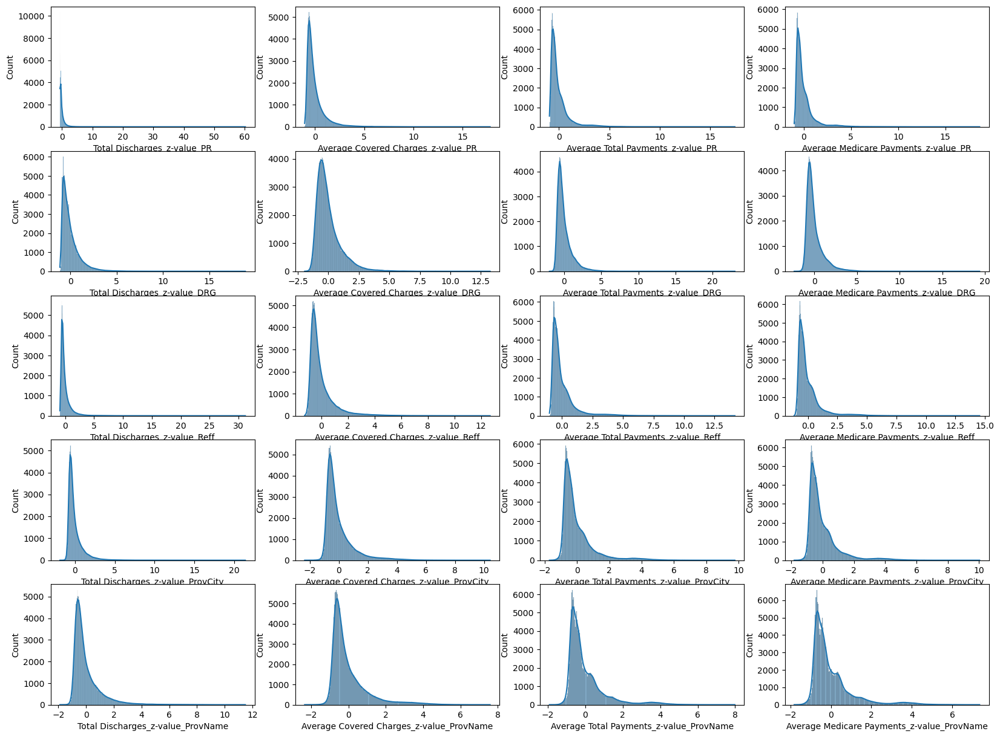

In [109]:
fig,ax=plt.subplots(nrows=5,ncols=4,figsize=[20,15])
for i,j in zip(df1.columns,ax.flatten()):
    sb.histplot(df1[i],ax=j,kde=True)
plt.show()

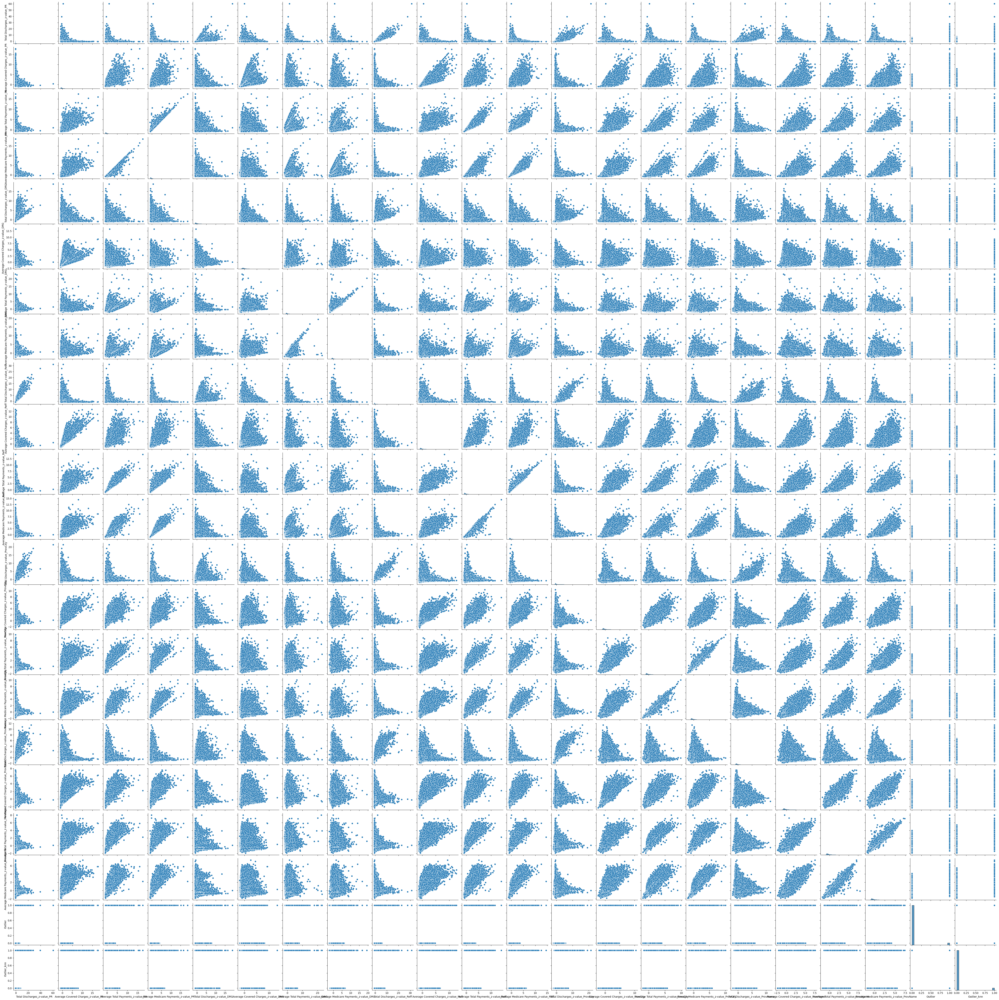

In [108]:
sb.pairplot(data=df1)

**EXPLAIN** 
* **PCA**:
     * PCA  is used for dimensionality reduction in high dimentional datasets.
     * PCA can be useful for highlighting outliers.
* **KNN**:
     * K-Nearest Neighbors (KNN) is a versatile algorithm in machine learning, used both in supervised and unsupervised learning contexts.
     * In PyOD, KNN is used for anomaly detection without relying on target labels. Instead, it calculates the distance of each data point to its k nearest neighbors and uses these distances to define outlier scores. 
    

In [40]:
from pyod.models.pca import PCA
pca = PCA(contamination=0.05) 

In [41]:
# pca.fit(X_train)
pca.fit(df1)

PCA(contamination=0.05, copy=True, iterated_power='auto', n_components=None,
  n_selected_components=None, random_state=None, standardization=True,
  svd_solver='auto', tol=0.0, weighted=True, whiten=False)

In [42]:
print("The threshold for the defined comtanimation rate:" , pca.threshold_)

The threshold for the defined comtanimation rate: 816227.7220328226


In [43]:
# y_train_scores = pca.decision_function(X_train)
# y_test_scores = pca.decision_function(X_test)
y_train_scores = pca.decision_function(df1)

In [44]:
threshold = pca.threshold_
threshold

def descriptive_stat_threshold(df,pred_score, threshold):
    # Let's see how many '0's and '1's.
    df = pd.DataFrame(df)
    df['Anomaly_Score'] = pred_score
    df['Group'] = np.where(df['Anomaly_Score']< threshold, 'Normal', 'Outlier')

    # Now let's show the summary statistics:
    cnt = df.groupby('Group')['Anomaly_Score'].count().reset_index().rename(columns={'Anomaly_Score':'Count'})
    cnt['Count %'] = (cnt['Count'] / cnt['Count'].sum()) * 100 # The count and count %
    stat = df.groupby('Group').mean().round(2).reset_index() # The avg.
    stat = cnt.merge(stat, left_on='Group',right_on='Group') # Put the count and the avg. together
    return (stat)

# descriptive_stat_threshold(X_train,y_train_scores, threshold)
# descriptive_stat_threshold(X_test,y_test_scores, threshold)
descriptive_stat_threshold(df1,y_train_scores, threshold)

,Group,Count,Count %,Total Discharges_z-value_PR,Average Covered Charges_z-value_PR,Average Total Payments_z-value_PR,Average Medicare Payments_z-value_PR,Total Discharges_z-value_DRG,Average Covered Charges_z-value_DRG,Average Total Payments_z-value_DRG,...,Average Medicare Payments_z-value_Reff,Total Discharges_z-value_ProvCity,Average Covered Charges_z-value_ProvCity,Average Total Payments_z-value_ProvCity,Average Medicare Payments_z-value_ProvCity,Total Discharges_z-value_ProvName,Average Covered Charges_z-value_ProvName,Average Total Payments_z-value_ProvName,Average Medicare Payments_z-value_ProvName,Anomaly_Score
0,Normal,154816,94.99954,-0.06,-0.13,-0.15,-0.15,-0.03,-0.01,-0.02,...,-0.15,-0.04,-0.14,-0.15,-0.15,-0.03,-0.13,-0.14,-0.14,315633.85
1,Outlier,8149,5.00046,1.04,2.41,2.92,2.89,0.56,0.27,0.41,...,2.90,0.79,2.57,2.80,2.77,0.64,2.55,2.72,2.70,1208717.36


In [45]:
df1['Outlier']=np.where(y_train_scores < threshold,0,1)
# X_train['Outlier']=np.where(y_train_scores < threshold,0,1)

In [46]:
df1.head()

,Total Discharges_z-value_PR,Average Covered Charges_z-value_PR,Average Total Payments_z-value_PR,Average Medicare Payments_z-value_PR,Total Discharges_z-value_DRG,Average Covered Charges_z-value_DRG,Average Total Payments_z-value_DRG,Average Medicare Payments_z-value_DRG,Total Discharges_z-value_Reff,Average Covered Charges_z-value_Reff,...,Average Medicare Payments_z-value_Reff,Total Discharges_z-value_ProvCity,Average Covered Charges_z-value_ProvCity,Average Total Payments_z-value_ProvCity,Average Medicare Payments_z-value_ProvCity,Total Discharges_z-value_ProvName,Average Covered Charges_z-value_ProvName,Average Total Payments_z-value_ProvName,Average Medicare Payments_z-value_ProvName,Outlier
0,0.908503,-0.013146,-0.461808,-0.459220,2.731021,0.155639,-0.800673,-0.640831,1.359967,0.228345,...,-0.276261,0.832397,-0.253140,-0.456736,-0.444381,0.600564,-0.102496,-0.492153,-0.486499,0
1,-0.573785,-0.601873,-0.460301,-0.426420,-0.782309,-0.962919,-0.793683,-0.468526,-0.637461,-0.551520,...,-0.307998,-0.819453,-0.147131,-0.376991,-0.293387,-0.819453,-0.147131,-0.376991,-0.293387,0
2,-0.381280,0.138641,-0.511775,-0.506951,-0.326033,0.444029,-1.032283,-0.891578,-0.351035,0.044807,...,-0.408636,-0.576670,-0.141190,-0.534900,-0.524413,-0.534283,0.023227,-0.490562,-0.477653,0
3,-0.362030,-0.639300,-0.514314,-0.556945,-0.280405,-1.034028,-1.044050,-1.154211,-0.322393,-0.581659,...,-0.471111,-0.443947,-0.749566,-0.537415,-0.540631,-0.273884,-0.736364,-0.498389,-0.532817,0
4,-0.496783,-0.057052,-0.479167,-0.445712,-0.599799,0.072220,-0.881133,-0.569872,-0.522891,-0.112782,...,-0.332107,-0.569835,-0.358372,-0.468360,-0.385997,-0.569835,-0.358372,-0.468360,-0.385997,0


In [47]:
df1.Outlier.value_counts()

Outlier
0    154816
1      8149
Name: count, dtype: int64

In [48]:
# train kNN detector
knn = KNN(contamination=0.05)
knn.fit(df1.iloc[:,:-1])
# If you want to see the predictions of the training data, you can use this way:
y_train_scores = knn.decision_scores_

  File "C:\Users\Nurat\anaconda3\envs\pytorch\Lib\site-packages\joblib\externals\loky\backend\context.py", line 199, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\Nurat\anaconda3\envs\pytorch\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\Nurat\anaconda3\envs\pytorch\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\Nurat\anaconda3\envs\pytorch\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


In [49]:
threshold = knn.threshold_
threshold

def descriptive_stat_threshold(df,pred_score, threshold):
    # Let's see how many '0's and '1's.
    df = pd.DataFrame(df)
    df['Anomaly_Score'] = pred_score
    df['Group'] = np.where(df['Anomaly_Score']< threshold, 'Normal', 'Outlier')

    # Now let's show the summary statistics:
    cnt = df.groupby('Group')['Anomaly_Score'].count().reset_index().rename(columns={'Anomaly_Score':'Count'})
    cnt['Count %'] = (cnt['Count'] / cnt['Count'].sum()) * 100 # The count and count %
    stat = df.groupby('Group').mean().round(2).reset_index() # The avg.
    stat = cnt.merge(stat, left_on='Group',right_on='Group') # Put the count and the avg. together
    return (stat)

descriptive_stat_threshold(df1,y_train_scores, threshold)

,Group,Count,Count %,Total Discharges_z-value_PR,Average Covered Charges_z-value_PR,Average Total Payments_z-value_PR,Average Medicare Payments_z-value_PR,Total Discharges_z-value_DRG,Average Covered Charges_z-value_DRG,Average Total Payments_z-value_DRG,...,Total Discharges_z-value_ProvCity,Average Covered Charges_z-value_ProvCity,Average Total Payments_z-value_ProvCity,Average Medicare Payments_z-value_ProvCity,Total Discharges_z-value_ProvName,Average Covered Charges_z-value_ProvName,Average Total Payments_z-value_ProvName,Average Medicare Payments_z-value_ProvName,Outlier,Anomaly_Score
0,Normal,154816,94.99954,-0.07,-0.10,-0.12,-0.11,-0.04,-0.03,-0.05,...,-0.06,-0.1,-0.11,-0.1,-0.05,-0.10,-0.10,-0.10,0.02,0.72
1,Outlier,8149,5.00046,1.26,1.87,2.21,2.11,0.76,0.61,0.99,...,1.10,1.9,2.00,1.9,1.04,1.89,1.93,1.84,0.61,2.29


In [50]:
df1['Outlier_knn']=np.where(y_train_scores < threshold,0,1)

In [51]:
df1.head()

,Total Discharges_z-value_PR,Average Covered Charges_z-value_PR,Average Total Payments_z-value_PR,Average Medicare Payments_z-value_PR,Total Discharges_z-value_DRG,Average Covered Charges_z-value_DRG,Average Total Payments_z-value_DRG,Average Medicare Payments_z-value_DRG,Total Discharges_z-value_Reff,Average Covered Charges_z-value_Reff,...,Total Discharges_z-value_ProvCity,Average Covered Charges_z-value_ProvCity,Average Total Payments_z-value_ProvCity,Average Medicare Payments_z-value_ProvCity,Total Discharges_z-value_ProvName,Average Covered Charges_z-value_ProvName,Average Total Payments_z-value_ProvName,Average Medicare Payments_z-value_ProvName,Outlier,Outlier_knn
0,0.908503,-0.013146,-0.461808,-0.459220,2.731021,0.155639,-0.800673,-0.640831,1.359967,0.228345,...,0.832397,-0.253140,-0.456736,-0.444381,0.600564,-0.102496,-0.492153,-0.486499,0,0
1,-0.573785,-0.601873,-0.460301,-0.426420,-0.782309,-0.962919,-0.793683,-0.468526,-0.637461,-0.551520,...,-0.819453,-0.147131,-0.376991,-0.293387,-0.819453,-0.147131,-0.376991,-0.293387,0,0
2,-0.381280,0.138641,-0.511775,-0.506951,-0.326033,0.444029,-1.032283,-0.891578,-0.351035,0.044807,...,-0.576670,-0.141190,-0.534900,-0.524413,-0.534283,0.023227,-0.490562,-0.477653,0,0
3,-0.362030,-0.639300,-0.514314,-0.556945,-0.280405,-1.034028,-1.044050,-1.154211,-0.322393,-0.581659,...,-0.443947,-0.749566,-0.537415,-0.540631,-0.273884,-0.736364,-0.498389,-0.532817,0,0
4,-0.496783,-0.057052,-0.479167,-0.445712,-0.599799,0.072220,-0.881133,-0.569872,-0.522891,-0.112782,...,-0.569835,-0.358372,-0.468360,-0.385997,-0.569835,-0.358372,-0.468360,-0.385997,0,0


In [52]:
df1.Outlier_knn.value_counts()

Outlier_knn
0    154816
1      8149
Name: count, dtype: int64

In [53]:
df.columns

Index(['DRG Definition', 'Provider Id', 'Provider Name',
       'Provider Street Address', 'Provider City', 'Provider State',
       'Provider Zip Code', 'Hospital Referral Region Description',
       'Total Discharges', 'Average Covered Charges', 'Average Total Payments',
       'Average Medicare Payments', 'Total Payment', 'Medicare Payment amount',
       'Total Covered Charge Amount', 'Provider Region',
       'Total Discharges_z-value_PR', 'Average Covered Charges_z-value_PR',
       'Average Total Payments_z-value_PR',
       'Average Medicare Payments_z-value_PR', 'Total Discharges_z-value_DRG',
       'Average Covered Charges_z-value_DRG',
       'Average Total Payments_z-value_DRG',
       'Average Medicare Payments_z-value_DRG',
       'Total Discharges_z-value_Reff', 'Average Covered Charges_z-value_Reff',
       'Average Total Payments_z-value_Reff',
       'Average Medicare Payments_z-value_Reff',
       'Total Discharges_z-value_ProvCity',
       'Average Covered Charges_

In [54]:
df.drop(columns=df.columns[16:],inplace=True)

In [55]:
df[['Outlier_PCA','Outlier_KNN']]=df1[['Outlier','Outlier_knn']]

In [56]:
df.head()

,DRG Definition,Provider Id,Provider Name,Provider Street Address,Provider City,Provider State,Provider Zip Code,Hospital Referral Region Description,Total Discharges,Average Covered Charges,Average Total Payments,Average Medicare Payments,Total Payment,Medicare Payment amount,Total Covered Charge Amount,Provider Region,Outlier_PCA,Outlier_KNN
0,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,AL - Dothan,91,32963.07,5777.24,4763.73,525728.84,433499.43,2999639.37,South,0.0,0.0
1,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10005,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,AL - Birmingham,14,15131.85,5787.57,4976.71,81025.98,69673.94,211845.90,South,0.0,0.0
2,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10006,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631,AL - Birmingham,24,37560.37,5434.95,4453.79,130438.80,106890.96,901448.88,South,0.0,0.0
3,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10011,ST VINCENT'S EAST,50 MEDICAL PARK EAST DRIVE,BIRMINGHAM,AL,35235,AL - Birmingham,25,13998.28,5417.56,4129.16,135439.00,103229.00,349957.00,South,0.0,0.0
4,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10016,SHELBY BAPTIST MEDICAL CENTER,1000 FIRST STREET NORTH,ALABASTER,AL,35007,AL - Birmingham,18,31633.27,5658.33,4851.44,101849.94,87325.92,569398.86,South,0.0,0.0


# Results

In [57]:
df.groupby('Outlier_PCA')[['Average Covered Charges','Average Total Payments','Average Medicare Payments','Total Discharges']].mean()

,Average Covered Charges,Average Total Payments,Average Medicare Payments,Total Discharges
Outlier_PCA,,,,
0.0,31852.820824,8541.123895,7393.050628,39.988218
1.0,117556.664540,31860.542231,29418.562367,95.274267


In [58]:
df.groupby('Outlier_KNN')[['Average Covered Charges','Average Total Payments','Average Medicare Payments','Total Discharges']].mean()

,Average Covered Charges,Average Total Payments,Average Medicare Payments,Total Discharges
Outlier_KNN,,,,
0.0,32622.463515,8795.484453,7662.153631,39.412858
1.0,102934.870106,27028.159837,24306.100654,106.205056


### PCA and KNN Outlier Detection by Region:

In [59]:
df.groupby(['Provider Region','Outlier_PCA'])[['Average Covered Charges','Average Total Payments','Average Medicare Payments','Total Discharges']].mean()

Average Covered Charges  Average Total Payments  \
Provider Region Outlier_PCA                                                    
Midwest         0.0                     26158.798078             8183.373770   
                1.0                     94077.304573            30094.756865   
Northeast       0.0                     32688.977631             9230.991830   
                1.0                    120046.629355            34503.282376   
South           0.0                     29713.131032             7905.989800   
                1.0                    105348.106325            29340.640473   
West            0.0                     44738.496063             9892.986408   
                1.0                    169888.721477            36723.595399   

                             Average Medicare Payments  Total Discharges  
Provider Region Outlier_PCA                                               
Midwest         0.0                        7016.489478         41.072707  
                1.0                       27457.096527         98.914117  
Northeast       0.0                        8139.844078         43.037935  
                1.0                       32265.459577         96.802734  
South           0.0                        6772.628077         40.956998  
                1.0                       26933.577603         99.944633  
West            0.0                        8670.573641         32.454961  
                1.0                       34240.798682         79.303230

Midwest:

Non-Outliers (0.00): Lower average values for covered charges, total payments, and Medicare payments, with a mean of 41.07 total dischgrses.
Outliers (1.00): Significantly higher averages in all financial categories and a mean of 98.91 total discharges.

### Northeast:
Non-Outliers: Moderate average values for covered charges, total payments, and Medicare payments, with a mean of 43.04 total discharges.
Outliers: Highest average values among all regions for outliers, with a substantial mean of 96.80 total discharges.

### South:

Non-Outliers: Similar to the Midwest in terms of financial figures, with a mean of 40.96 total discharges.
Outliers: High averages, but lower than the Northeast outliers, with a mean of 99.94 total discharges.

### West:
Non-Outliers: The lowest average values for covered charges and total payments, with a mean of 32.45 total discharges.
Outliers: Very high average values, particularly for covered charges, with a mean of 79.30 total discharges.

In [95]:
df.groupby(['Provider Region','Outlier_KNN'])[['Average Covered Charges','Average Total Payments','Average Medicare Payments','Total Discharges']].mean()

Average Covered Charges  Average Total Payments  \
Provider Region Outlier_KNN                                                    
Midwest         0.00                        27240.33                 8558.05   
                1.00                        83427.07                26013.73   
Northeast       0.00                        32943.07                 9347.83   
                1.00                        99036.80                27784.52   
South           0.00                        30885.62                 8238.37   
                1.00                        89741.86                24915.57   
West            0.00                        44981.78                 9989.80   
                1.00                       140731.69                29895.06   

                             Average Medicare Payments  Total Discharges  
Provider Region Outlier_KNN                                               
Midwest         0.00                           7404.41             40.88  
                1.00                          22688.30            117.70  
Northeast       0.00                           8270.64             41.54  
                1.00                          25566.72            108.31  
South           0.00                           7113.91             40.54  
                1.00                          22119.47            118.08  
West            0.00                           8797.57             31.65  
                1.00                          27283.93             79.99

### Midwest:
Non-Outliers: Similar pattern as in PCA, with moderate average values and a mean of 40.88 total discharges.
Outliers: Extremely high averages in all financial categories and a mean of 117.70 total discharges.

### Northeast:
Non-Outliers: Higher average values than the Midwest non-outliers and a mean of 41.54 total discharges.
Outliers: Very high averages, especially for covered charges, with a mean of 108.31 total discharges.

### South:

Non-Outliers: Lower average values compared to the Northeast non-outliers, with a mean of 40.54 total discharges.
Outliers: High averages, slightly less than the Northeast outliers, with a mean of 118.08 total discharges.

### West:

Non-Outliers: The lowest average values for covered charges and total payments, similar to PCA, with a mean of 31.65 total discharges.
Outliers: Extremely high averages, with the highest average total payments and a mean of 79.99 total discharges.

In [104]:
df.groupby(['Provider Region','Provider State','Outlier_PCA'])[['Average Covered Charges','Average Total Payments','Average Medicare Payments','Total Discharges']].mean()

Average Covered Charges  \
Provider Region Provider State Outlier_PCA                            
Midwest         IA             0.00                        22007.83   
                               1.00                        73337.00   
                IL             0.00                        31895.00   
                               1.00                       110786.25   
                IN             0.00                        25200.37   
...                                                             ...   
West            UT             1.00                        74467.75   
                WA             0.00                        30561.30   
                               1.00                       111238.53   
                WY             0.00                        26183.91   
                               1.00                        95253.15   

                                            Average Total Payments  \
Provider Region Provider State Outlier_PCA                           
Midwest         IA             0.00                        7551.68   
                               1.00                       25625.38   
                IL             0.00                        8587.56   
                               1.00                       31363.06   
                IN             0.00                        7749.81   
...                                                            ...   
West            UT             1.00                       30404.23   
                WA             0.00                        9227.03   
                               1.00                       34794.78   
                WY             0.00                       10370.71   
                               1.00                       38577.57   

                                            Average Medicare Payments  \
Provider Region Provider State Outlier_PCA                              
Midwest         IA             0.00                           6429.16   
                               1.00                          23506.89   
                IL             0.00                           7287.61   
                               1.00                          28066.89   
                IN             0.00                           6564.99   
...                                                               ...   
West            UT             1.00                          25603.25   
                WA             0.00                           7891.56   
                               1.00                          30911.08   
                WY             0.00                           8693.61   
                               1.00                          31905.66   

                                            Total Discharges  
Provider Region Provider State Outlier_PCA                    
Midwest         IA             0.00                    36.62  
                               1.00                   108.95  
                IL             0.00                    43.11  
                               1.00                    92.51  
                IN             0.00                    40.83  
...                                                      ...  
West            UT             1.00                   106.48  
                WA             0.00                    35.48  
                               1.00                    94.64  
                WY             0.00                    25.87  
                               1.00                    42.11  

[102 rows x 4 columns]

In [72]:
df2=df[df['Outlier_PCA']==1].groupby(['DRG Definition','Outlier_PCA'])[['Average Covered Charges','Average Total Payments','Average Medicare Payments','Total Discharges']].mean()
df2

,,Average Covered Charges,Average Total Payments,Average Medicare Payments,Total Discharges
DRG Definition,Outlier_PCA,,,,
039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,1.0,58864.753333,11241.780000,9974.836667,71.333333
057 - DEGENERATIVE NERVOUS SYSTEM DISORDERS W/O MCC,1.0,54021.374286,17807.197143,16315.122857,90.857143
064 - INTRACRANIAL HEMORRHAGE OR CEREBRAL INFARCTION W MCC,1.0,119932.456667,26644.429333,24398.508000,83.066667
065 - INTRACRANIAL HEMORRHAGE OR CEREBRAL INFARCTION W CC,1.0,65403.240714,16585.227143,12970.999286,123.857143
066 - INTRACRANIAL HEMORRHAGE OR CEREBRAL INFARCTION W/O CC/MCC,1.0,97462.095000,11520.025000,10480.970000,24.000000
...,...,...,...,...,...
885 - PSYCHOSES,1.0,21563.062422,7401.941953,6452.218750,418.335938
897 - ALCOHOL/DRUG ABUSE OR DEPENDENCE W/O REHABILITATION THERAPY W/O MCC,1.0,19732.196250,7884.907500,7209.168750,246.250000
917 - POISONING & TOXIC EFFECTS OF DRUGS W MCC,1.0,151928.800000,30155.863333,24660.546667,12.333333


## Interpretation:
Outliers vs Non-Outliers:
For both PCA and KNN, the outliers have significantly higher average charges and payments compared to non-outliers.
The mean total discharges for outliers are also higher, suggesting that outliers may be associated with higher volume facilities or more complex cases that justify higher chargo PCA.

## Comparison between PCA and KNN:
While both methods identify outliers with higher charges and payments, there is a noticeable difference in the magnitude. Outliers detected by PCA have even higher average charges and payments than those detected by KNN, which could suggest that PCA is more sensitive to extreme values or that it captures different aspects of the data that lead to a classification as an outlier.
The average number of discharges for outliers is also higher in the KNN method compared to PCA.
There is consistency in the pattern of outliers having higher values across both methods, but the KNN method seems to flag more extreme values as outliers compared to PCA, particularly in the Midwest and West regions.

## Business Implications:
The marked difference between outliers and non-outliers in terms of financial figures could point to potential cases of fraud, waste, or abuse, or they could be legitimate cases where higher costs are justified.
The differences between PCA and KNN in identifying outliers could suggest that combining these methods may provide a more comprehensive approach to detecting potential fraud.
The higher total discharges among outliers may warrant further investigation to determine if this is due to legitimate reasons such as a specialization in certain high-cost treatments or if it's an indication of potential overcharging or unnecessary services being render
The Northeast region appears to have the highest average values for outliers detected by both methods, suggesting this region may require more focused audit and fraud detection efforts.
Outliers identified by KNN in the Midwest show particularly high average covered charges, which could warrant further investigation.
The consistency of the West region having the lowest non-outlier values across both methods might indicate a different pricing structure or market conditions in that region.
The differences in outlier detection between PCA and KNN underscore the importance of using multiple methods for a more robust fraud detection strategy.ed.
In summary, these results suggest that there are distinct differences between the data points flagged as outliers and those that are not, according to both PCA and KNN algorithms. Further investigation into the reasons behind these discrepancies would be necessary to determine if they are due to fraud or other factors.